# Particle Data Projections

This tutorial demonstrates advanced projection techniques for stellar and dark matter particle data using MERA.jl. Learn how to create 2D projections from N-body simulations, analyze stellar populations, and investigate galactic structure through particle-based analysis.

## Quick Reference

### Essential Functions
```julia
# Basic particle projection
projection(particles, :variable, :unit)

# Multi-quantity projection  
projection(particles, [:var1, :var2], units=[:unit1, :unit2])

# Spatial selection
projection(particles, :sd, :Msol_pc2, 
          xrange=[-10,10], center=[:boxcenter], range_unit=:kpc)

# Direction control
projection(particles, :sd, :Msol_pc2, direction=:x)  # x, y, z directions

# Resolution control
projection(particles, :sd, :Msol_pc2, lmax=9)       # AMR level
projection(particles, :sd, :Msol_pc2, res=256)      # Effective grid resolution  
projection(particles, :sd, :Msol_pc2, pxsize=[100.,:pc])  # Physical pixel size

# Stellar population analysis
projection(particles, :age, :Myr, mask=age_mask)
projection(particles, :birth, :Myr, ref_time=0.)
```

### Key Particle Quantities
- **`:sd`** - Surface density (Σ) 
- **`:vx, :vy, :vz`** - Velocity components
- **`:v`** - Total velocity magnitude
- **`:σ, :σx, :σy, :σz`** - Velocity dispersions
- **`:ekin`** - Kinetic energy
- **`:age`** - Stellar age (relative to snapshot time)
- **`:birth`** - Birth time (absolute)
- **`:r_cylinder, :vr_cylinder, :vϕ_cylinder`** - Cylindrical coordinates
- **`:ϕ, :σr_cylinder, :σϕ_cylinder`** - Cylindrical kinematic quantities

## Overview

MERA.jl provides comprehensive projection capabilities for particle-based simulations:
- **Stellar surface density projections** in arbitrary directions
- **Kinematic analysis** of stellar and dark matter components
- **Stellar population studies** through age and birth time projections
- **Multi-component analysis** with customizable units
- **Coordinate system transformations** (Cartesian, cylindrical, spherical)
- **Advanced masking and filtering** for population selection

## Key Concepts

- **Particle Types**: Stellar particles, dark matter,...
- **Population Analysis**: Age-based selection and temporal evolution
- **Projection Direction**: Control viewing angle (x, y, z directions)
- **Grid Resolution**: Customize output resolution via `lmax`, `res`, or `pxsize`
- **Weighting Schemes**: Mass-weighted projections, ...

## Environment Setup and Data Loading

### Package Configuration and Particle Data

Load particle data from N-body simulations including stellar particles, dark matter, and other particle types.

In [1]:
# Example-data root. Point this at your own simulation folder, or set the
# MERA_EXAMPLES environment variable; every path below is built from it.
MERA_EXAMPLES = get(ENV, "MERA_EXAMPLES", "/Volumes/FASTStorage/Simulations/Mera-Tests");

using Mera

# Load simulation metadata
# Replace with your simulation path and output number
info = getinfo(300, "$MERA_EXAMPLES/RAMSES/mw_L10")

# Load particle data (stellar particles, dark matter, etc.)
# Includes position, velocity, mass, and stellar population properties
particles = getparticles(info);


*__   __ _______ ______   _______ 


|  |_|  |       |    _ | |   _   |
|       |    ___|   | || |  |_|  |
|       |   |___|   |_||_|       |
|       |    ___|    __  |       |
| ||_|| |   |___|   |  | |   _   |
|_|   |_|_______|___|  |_|__| |__|
Mera v1.8.0

[Mera]: 2026-08-03T11:03:34.121



Code: RAMSES


output [300] summary:
mtime: 2023-04-09T05:34:09
ctime: 2025-06-21T18:31:24.020
simulation time: 445.89 [Myr]
boxlen: 48.0 [kpc]
ncpu: 640
ndim: 3
cosmological:  false
-------------------------------------------------------
amr:           true
level(s): 

6 - 10 --> cellsize(s): 750.0 [pc] - 46.88 [pc]
-------------------------------------------------------
hydro:         true
hydro-variables:  

7  --> (:rho, :vx, :vy, :vz, :p, :scalar_00, :scalar_01)
hydro-descriptor: (:density, :velocity_x, :velocity_y, :velocity_z, :pressure, :scalar_00, :scalar_01)
γ: 1.6667
-------------------------------------------------------
gravity:       true
gravity-variables: (:epot, :ax, :ay, :az)
-------------------------------------------------------
particles:     true
- Nstars:   5.445150e+05 
particle-variables: 

7  --> (:vx, :vy, :vz, :mass, :family, :tag, :birth)
particle-descriptor: (:position_x, :position_y, :position_z, :velocity_x, :velocity_y, :velocity_z, :mass, :identity, :levelp, :family, :tag, :birth_time)
-------------------------------------------------------
rt:            false
clumps:           false
-------------------------------------------------------
namelist-file: 

("&COOLING_PARAMS", "&SF_PARAMS", "&AMR_PARAMS", "&BOUNDARY_PARAMS", "&OUTPUT_PARAMS", "&POISSON_PARAMS", "&RUN_PARAMS", "&FEEDBACK_PARAMS", "&HYDRO_PARAMS", "&INIT_PARAMS", "&REFINE_PARAMS")
-------------------------------------------------------
timer-file:       true
compilation-file: false
makefile:         true
patchfile:        true

[Mera]: Get particle data: 2026-08-03T11:03:39.167



Using threaded processing with 4 threads
Key vars=(:level, :x, :y, :z, :id, :family, :tag)
Using var(s)=(1, 2, 3, 4, 7) = (:vx, :vy, :vz, :mass, :birth) 

domain:


xmin::xmax: 0.0 :: 1.0  	==> 0.0 [kpc] :: 48.0 [kpc]
ymin::ymax: 0.0 :: 1.0  	==> 0.0 [kpc] :: 48.0 [kpc]
zmin::zmax: 0.0 :: 1.0  	==> 0.0 [kpc] :: 48.0 [kpc]

Processing 640 CPU files using 4 threads
Mode: Threaded processing


Combining results from 4 thread(s)...
Found 5.445150e+05 particles
Memory used for data table :

38.428720474243164 MB
-------------------------------------------------------



In [2]:
# Inspect the loaded particle data structure
# Shows available fields 
particles.data

Table with 544515 rows, 12 columns:
Columns:
#   colname  type
────────────────────
1   level    Int32
2   x        Float64
3   y        Float64
4   z        Float64
5   id       Int32
6   family   Int8
7   tag      Int8
8   vx       Float64
9   vy       Float64
10  vz       Float64
11  mass     Float64
12  birth    Float64

## Projection of Predefined Quantities

See the possible variables:

In [3]:
# Show all available projection quantities and their descriptions
# Displays particle-specific variables and derived quantities
projection()

Predefined vars for projections:
------------------------------------------------
=====================[gas]:=====================
       -all the non derived hydro vars-
:cpu, :level, :rho, :cx, :cy, :cz, :vx, :vy, :vz, :p, var6,...
further possibilities: :rho, :density, :ρ
              -derived hydro vars-
:x, :y, :z
:sd or :Σ or :surfacedensity
:mass, :cellsize, :freefall_time
:cs, :mach, :machx, :machy, :machz, :jeanslength, :jeansnumber
:t, :Temp, :Temperature with p/rho

==================[particles]:==================
        all the non derived  vars:
:cpu, :level, :id, :family, :tag 
:x, :y, :z, :vx, :vy, :vz, :mass, :birth, :metal....

              -derived particle vars-
:age

==============[gas or particles]:===============
:v, :ekin
squared => :vx2, :vy2, :vz2
velocity dispersion => σx, σy, σz, σ

related to a given center:
---------------------------
:vr_cylinder, vr_sphere (radial components)
:vϕ_cylinder, :vθ
squared => :vr_cylinder2, :vϕ_cylinder2
velocity dispersion

## Projection of a Single Quantity in Different Directions (z,y,x)

Here we project the surface density in the z-direction of the data within a particular vertical range (`domain=[0:1]`) on a grid corresponding to level=9. Pass any object of ParticleDataType (here: "particles") to the projection-function and select a variable by a Symbol (here: `:sd` = `:surfacedensity` = `:Σ` in M⊙/pc²).

In [4]:
# Basic surface density projection in z-direction
# Projects stellar particles onto xy-plane with specified resolution
# Z-direction: projects particles onto xy-plane (face-on view)
# X-direction: projects particles onto yz-plane (edge-on view) 
proj_z = projection(particles, :sd, :Msol_pc2, lmax=9, zrange=[0.45,0.55], verbose=false)
proj_x = projection(particles, :sd, :Msol_pc2, lmax=9, direction=:x, zrange=[0.45,0.55], verbose=false);

### Select a Range Related to a Center

See also in the documentation for: load data by selection

In [5]:
# Calculate box center coordinates for spatial selection
cv = (particles.boxlen / 2.) * particles.scale.kpc # provide the box-center in kpc
proj_z = projection(particles, :sd, :Msol_pc2, lmax=9,
                    xrange=[-10.,10.], yrange=[-10.,10.], zrange=[-2.,2.], 
                    center=[cv,cv,cv], range_unit=:kpc);

[Mera]: 2026-08-03T11:03:51.758



center: [0.5, 0.5, 0.5] ==> [24.0 [kpc] :: 24.0 [kpc] :: 24.0 [kpc]]

domain:
xmin::xmax: 0.2916667 :: 0.7083333  	==> 14.0 [kpc] :: 34.0 [kpc]
ymin::ymax: 0.2916667 :: 0.7083333  	==> 14.0 [kpc] :: 34.0 [kpc]
zmin::zmax: 0.4583333 :: 0.5416667  	==> 22.0 [kpc] :: 26.0 [kpc]

Effective resolution: 512^2
Pixel size: 93.75 [pc]
Simulation min.: 46.875 [pc]



Use the short notation for the box center `:bc` or `:boxcenter` for all dimensions (x,y,z):

In [6]:
# Use convenient box center notation for spatial selection
proj_z = projection(particles, :sd, :Msol_pc2, lmax=9,
                    xrange=[-10.,10.], yrange=[-10.,10.], zrange=[-2.,2.], 
                    center=[:boxcenter], range_unit=:kpc);

[Mera]: 2026-08-03T11:03:54.137



center: [0.5, 0.5, 0.5] ==> [24.0 [kpc] :: 24.0 [kpc] :: 24.0 [kpc]]



domain:
xmin::xmax: 0.2916667 :: 0.7083333  	==> 14.0 [kpc] :: 34.0 [kpc]
ymin::ymax: 0.2916667 :: 0.7083333  	==> 14.0 [kpc] :: 34.0 [kpc]
zmin::zmax: 0.4583333 :: 0.5416667  	==> 22.0 [kpc] :: 26.0 [kpc]

Effective resolution: 512^2
Pixel size: 93.75 [pc]
Simulation min.: 46.875 [pc]



In [7]:
# Alternative short notation using :bc
proj_z = projection(particles, :sd, :Msol_pc2, lmax=9,
                    xrange=[-10.,10.], yrange=[-10.,10.], zrange=[-2.,2.], 
                    center=[:bc], range_unit=:kpc);

[Mera]: 2026-08-03T11:03:55.924

center: [0.5, 0.5, 0.5] ==> [24.0 [kpc] :: 24.0 [kpc] :: 24.0 [kpc]]

domain:
xmin::xmax: 0.2916667 :: 0.7083333  	==> 14.0 [kpc] :: 34.0 [kpc]
ymin::ymax: 0.2916667 :: 0.7083333  	==> 14.0 [kpc] :: 34.0 [kpc]
zmin::zmax: 0.4583333 :: 0.5416667  	==> 22.0 [kpc] :: 26.0 [kpc]

Effective resolution: 512^2
Pixel size: 93.75 [pc]
Simulation min.: 46.875 [pc]



Use the box center notation for individual dimensions, here x,z:

In [8]:
# Mix explicit coordinates with box center notation
proj_z = projection(particles, :sd, :Msol_pc2, lmax=9, 
                    xrange=[-10.,10.], yrange=[-10.,10.], zrange=[-2.,2.], 
                    center=[:bc, 24., :bc], range_unit=:kpc);

[Mera]: 2026-08-03T11:03:58.133



center: [0.5, 0.5, 0.5] ==> [24.0 [kpc] :: 24.0 [kpc] :: 24.0 [kpc]]

domain:
xmin::xmax: 0.2916667 :: 0.7083333  	==> 14.0 [kpc] :: 34.0 [kpc]
ymin::ymax: 0.2916667 :: 0.7083333  	==> 14.0 [kpc] :: 34.0 [kpc]
zmin::zmax: 0.4583333 :: 0.5416667  	==> 22.0 [kpc] :: 26.0 [kpc]

Effective resolution: 512^2


Pixel size: 93.75 [pc]
Simulation min.: 46.875 [pc]



### Get Multiple Quantities

Get several quantities with one function call by passing an array containing the selected variables (at least one entry). The keyword name for the units is now in plural.

In [9]:
# Project multiple quantities simultaneously
proj1_x = projection(particles, [:sd], units=[:Msol_pc2], lmax=9,
                     direction=:x, 
                     xrange=[-10.,10.], 
                     yrange=[-10.,10.], 
                     zrange=[-2.,2.], 
                     center=[24.,24.,24.], 
                     range_unit=:kpc);

[Mera]: 2026-08-03T11:03:59.956

center: [0.5, 0.5, 0.5] ==> [24.0 [kpc] :: 24.0 [kpc] :: 24.0 [kpc]]

domain:
xmin::xmax: 0.2916667 :: 0.7083333  	==> 14.0 [kpc] :: 34.0 [kpc]
ymin::ymax: 0.2916667 :: 0.7083333  	==> 14.0 [kpc] :: 34.0 [kpc]
zmin::zmax: 0.4583333 :: 0.5416667  	==> 22.0 [kpc] :: 26.0 [kpc]

Effective resolution: 512^2
Pixel size: 93.75 [pc]
Simulation min.: 46.875 [pc]



Pass an array containing several quantities to process and their corresponding units:

In [10]:
# Project surface density and x-velocity component together
proj1_z = projection(particles, [:sd, :vx], units=[:Msol_pc2, :km_s], lmax=9,
                     direction=:x,
                     xrange=[-10.,10.], 
                     yrange=[-10.,10.], 
                     zrange=[-2.,2.], 
                     center=[24.,24.,24.], 
                     range_unit=:kpc);

[Mera]: 2026-08-03T11:04:01.660

center: [0.5, 0.5, 0.5] ==> [24.0 [kpc] :: 24.0 [kpc] :: 24.0 [kpc]]

domain:
xmin::xmax: 0.2916667 :: 0.7083333  	==> 14.0 [kpc] :: 34.0 [kpc]
ymin::ymax: 0.2916667 :: 0.7083333  	==> 14.0 [kpc] :: 34.0 [kpc]
zmin::zmax: 0.4583333 :: 0.5416667  	==> 22.0 [kpc] :: 26.0 [kpc]

Effective resolution: 512^2
Pixel size: 93.75 [pc]
Simulation min.: 46.875 [pc]



The function can be called without any keywords by preserving the following order: dataobject, variables, units

In [11]:
# Simplified syntax without explicit keywords
proj1_z = projection(particles, [:sd, :vx], [:Msol_pc2, :km_s], lmax=9,
                     direction=:x,
                     xrange=[-10.,10.], 
                     yrange=[-10.,10.], 
                     zrange=[-2.,2.], 
                     center=[24.,24.,24.], 
                     range_unit=:kpc);

[Mera]: 2026-08-03T11:04:03.811

center: [0.5, 0.5, 0.5] ==> [24.0 [kpc] :: 24.0 [kpc] :: 24.0 [kpc]]

domain:
xmin::xmax: 0.2916667 :: 0.7083333  	==> 14.0 [kpc] :: 34.0 [kpc]
ymin::ymax: 0.2916667 :: 0.7083333  	==> 14.0 [kpc] :: 34.0 [kpc]
zmin::zmax: 0.4583333 :: 0.5416667  	==> 22.0 [kpc] :: 26.0 [kpc]

Effective resolution: 512^2
Pixel size: 93.75 [pc]
Simulation min.: 46.875 [pc]



If all selected variables should be of the same unit use the following arguments: dataobject, array of quantities, unit (no array needed)

In [12]:
# Project multiple velocity components with unified units
projvel_z = projection(particles, [:vx, :vy, :vz], :km_s, lmax=9,
                       xrange=[-10.,10.], 
                       yrange=[-10.,10.], 
                       zrange=[-2.,2.], 
                       center=[24.,24.,24.], 
                       range_unit=:kpc);

[Mera]: 2026-08-03T11:04:05.527

center: [0.5, 0.5, 0.5] ==> [24.0 [kpc] :: 24.0 [kpc] :: 24.0 [kpc]]

domain:
xmin::xmax: 0.2916667 :: 0.7083333  	==> 14.0 [kpc] :: 34.0 [kpc]
ymin::ymax: 0.2916667 :: 0.7083333  	==> 14.0 [kpc] :: 34.0 [kpc]
zmin::zmax: 0.4583333 :: 0.5416667  	==> 22.0 [kpc] :: 26.0 [kpc]

Effective resolution: 512^2
Pixel size: 93.75 [pc]
Simulation min.: 46.875 [pc]



## Function Output

List the fields of the assigned object:

In [13]:
# Examine the structure of projection objects
propertynames(projvel_z)

(:maps, :maps_unit, :maps_lmax, :maps_mode, :lmax_projected, :lmin, :lmax, :ref_time, :ranges, :extent, :cextent, :ratio, :effres, :pixsize, :boxlen, :scale, :info, :los, :up, :cam_right, :center)

The projected 2D maps are stored in a dictionary:

In [14]:
# Access the maps dictionary containing projection data
projvel_z.maps  # NaN for empty regions

DataStructures.SortedDict{Any, Any, Base.Order.ForwardOrdering} with 4 entries:
  :sd => [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 …
  :vx => [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN; NaN NaN …
  :vy => [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN; NaN NaN …
  :vz => [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN; NaN NaN …

The maps can be accessed by giving the name of the dictionary:

In [15]:
# Access individual projection maps by variable name
proj1_z.maps[:sd]

214×44 Matrix{Float64}:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 

The units of the maps are stored in:

In [16]:
# Check units for each projected quantity
projvel_z.maps_unit

DataStructures.SortedDict{Any, Any, Base.Order.ForwardOrdering} with 4 entries:
  :sd => :standard
  :vx => :km_s
  :vy => :km_s
  :vz => :km_s

The following fields are helpful for further calculations or plots.

In [17]:
# Get coordinate ranges normalized to domain [0:1]
projvel_z.ranges

6-element Vector{Float64}:
 0.29166666666647767
 0.7083333333328743
 0.29166666666647767
 0.7083333333328743
 0.4583333333330363
 0.5416666666663156

In [18]:
# Get coordinate ranges in code units
projvel_z.extent

4-element Vector{Float64}:
 13.96875
 34.03125
 13.96875
 34.03125

In [19]:
# Get coordinate ranges relative to center (code units)
projvel_z.cextent

4-element Vector{Float64}:
 -10.031249999984446
  10.031250000015554
 -10.031249999984446
  10.031250000015554

In [20]:
# Get aspect ratio between coordinate ranges
projvel_z.ratio  # the ratio between the two ranges

1.0

## Plot Maps with PyPlot

In [21]:
proj_z = projection(particles, :sd, :Msol_pc2, lmax=9,
                    zrange=[-2.,2.], center=[:boxcenter], range_unit=:kpc,
                    verbose=false) 
proj_x = projection(particles, :sd, :Msol_pc2, lmax=9,
                    zrange=[-2.,2.], center=[:boxcenter], range_unit=:kpc,
                    verbose=false, 
                    direction = :x);

Python functions can be directly called in Julia, which gives the opportunity, e.g. to use the Matplotlib library.

In [22]:
using PyPlot
rc("figure", dpi=300); rc("savefig", dpi=300)
using ColorSchemes
cmap = ColorMap(ColorSchemes.lajolla.colors) # See http://www.fabiocrameri.ch/colourmaps.php
cmap2 = ColorMap(reverse(ColorSchemes.roma.colors))

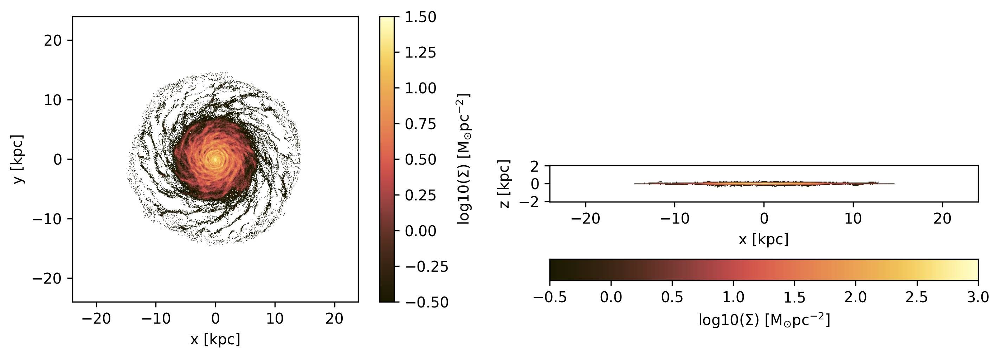

In [23]:
figure(figsize=(10, 3.5))
subplot(1,2,1)
im = imshow( log10.( permutedims(proj_z.maps[:sd])), cmap=cmap, aspect=proj_z.ratio, origin="lower", extent=getextent(proj_z, :kpc; center=true), vmin=-0.5, vmax=1.5)
xlabel("x [kpc]")
ylabel("y [kpc]")
cb = colorbar(im, label=L"\mathrm{log10(\Sigma) \ [M_{\odot} pc^{-2}]}")

subplot(1,2,2)
im = imshow( log10.( permutedims(proj_x.maps[:sd])), cmap=cmap, origin="lower", extent=getextent(proj_x, :kpc; center=true), vmin=-0.5, vmax=3)
xlabel("x [kpc]")
ylabel("z [kpc]")
cb = colorbar(im, label=L"\mathrm{log10(\Sigma) \ [M_{\odot} pc^{-2}]}",orientation="horizontal", pad=0.2);
tight_layout()

Project a specific spatial range and plot the axes of the map relative to the box-center (given by keyword: data_center):

In [24]:
proj_z = projection(particles, :sd, :Msol_pc2, lmax=9, 
                    xrange=[-10.,0.], yrange=[-10.,0.], zrange=[-2.,2.], center=[:boxcenter], range_unit=:kpc,
                    verbose=false, 
                    data_center=[24.,24.,24.], data_center_unit=:kpc) 
proj_x = projection(particles, :sd, :Msol_pc2, lmax=9,
                    xrange=[-10.,0.], yrange=[-10.,0.], zrange=[-2.,2.], center=[:boxcenter], range_unit=:kpc,
                    verbose=false, 
                    data_center=[24.,24.,24.], data_center_unit=:kpc, 
                    direction = :x);

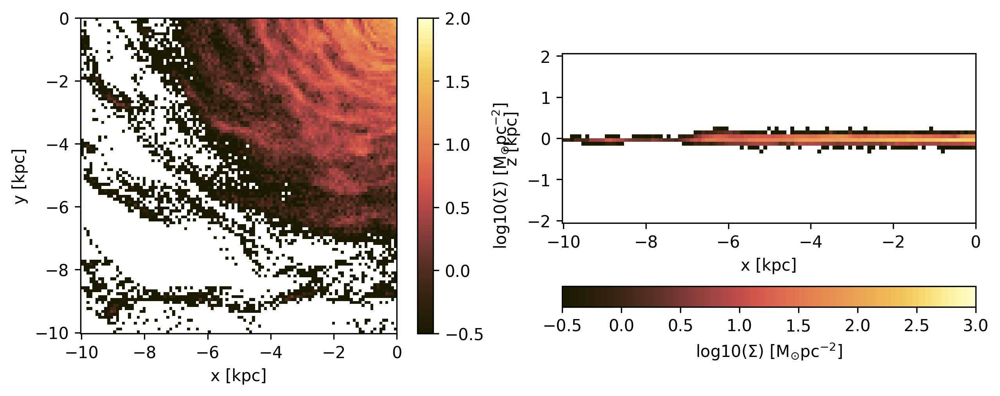

In [25]:
figure(figsize=(10, 3.5))
subplot(1,2,1)
im = imshow( log10.( permutedims(proj_z.maps[:sd])), cmap=cmap, aspect=proj_z.ratio, origin="lower", extent=getextent(proj_z, :kpc; center=true), vmin=-0.5, vmax=2.)
xlabel("x [kpc]")
ylabel("y [kpc]")
cb = colorbar(im, label=L"\mathrm{log10(\Sigma) \ [M_{\odot} pc^{-2}]}")

subplot(1,2,2)
im = imshow( log10.( permutedims(proj_x.maps[:sd])), cmap=cmap, origin="lower", extent=getextent(proj_x, :kpc; center=true), vmin=-0.5, vmax=3)
xlabel("x [kpc]")
ylabel("z [kpc]")
cb = colorbar(im, label=L"\mathrm{log10(\Sigma) \ [M_{\odot} pc^{-2}]}",orientation="horizontal", pad=0.2);

Plot the axes of the map relative to the map-center (given by keyword: data_center):

In [26]:
proj_z = projection(particles, :sd, :Msol_pc2, lmax=9,
                    xrange=[-10.,0.], yrange=[-10.,0.], zrange=[-2.,2.], center=[:boxcenter], range_unit=:kpc,
                    verbose=false, 
                    data_center=[19.,19.,24.], data_center_unit=:kpc) 
proj_x = projection(particles, :sd, :Msol_pc2, lmax=9,
                    xrange=[-10.,0.], yrange=[-10.,0.], zrange=[-2.,2.], center=[:boxcenter], range_unit=:kpc,
                    verbose=false, 
                    data_center=[19.,19.,24.], data_center_unit=:kpc, 
                    direction = :x);

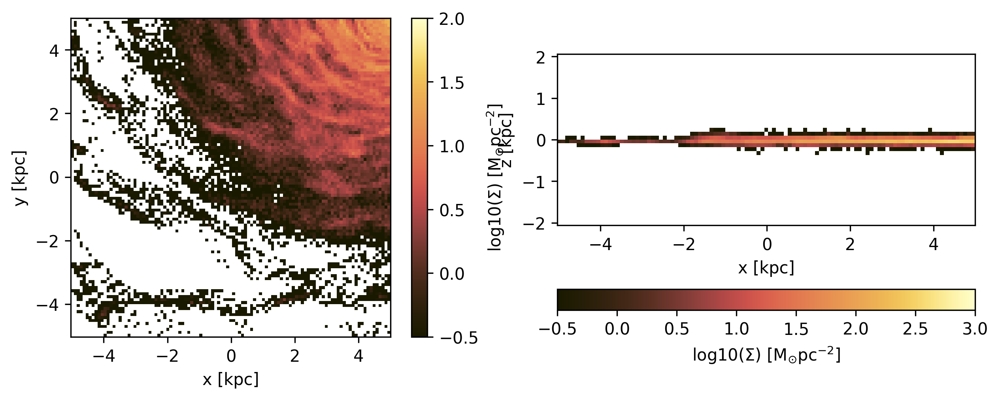

In [27]:
figure(figsize=(10, 3.5))
subplot(1,2,1)
im = imshow( log10.( permutedims(proj_z.maps[:sd])), cmap=cmap, aspect=proj_z.ratio, origin="lower", extent=getextent(proj_z, :kpc; center=true), vmin=-0.5, vmax=2.)
xlabel("x [kpc]")
ylabel("y [kpc]")
cb = colorbar(im, label=L"\mathrm{log10(\Sigma) \ [M_{\odot} pc^{-2}]}")

subplot(1,2,2)
im = imshow( log10.( permutedims(proj_x.maps[:sd])), cmap=cmap, origin="lower", extent=getextent(proj_x, :kpc; center=true), vmin=-0.5, vmax=3)
xlabel("x [kpc]")
ylabel("z [kpc]")
cb = colorbar(im, label=L"\mathrm{log10(\Sigma) \ [M_{\odot} pc^{-2}]}",orientation="horizontal", pad=0.2);

## Projections of Derived Kinematic Data

#### Use quantities in cartesian coordinates:

Project the following derived data
(mass weighted by default): The absolute value of the velocity :v, the velocity dispersion :σ in different directions and the kinetic energy :ekin. The Julia language supports Unicode characters and can be inserted by e.g. "\sigma + tab-key" leading to: **σ**.

In [28]:
# σ: Total 3D velocity dispersion = √(σx² + σy² + σz²)
# σx, σy, σz: Velocity dispersions along coordinate axes
proj_z = projection(particles, [:v, :σ, :σx, :σy, :σz, :ekin], 
                    units=[:km_s,:km_s,:km_s,:km_s,:km_s,:erg], 
                    lmax=9,
                    xrange=[-10.,10.], yrange=[-10.,10.], zrange=[-2.,2.], 
                    center=[24.,24.,24.], range_unit=:kpc);

[Mera]: 2026-08-03T11:04:23.505



center: [0.5, 0.5, 0.5] ==> [24.0 [kpc] :: 24.0 [kpc] :: 24.0 [kpc]]

domain:
xmin::xmax: 0.2916667 :: 0.7083333  	==> 14.0 [kpc] :: 34.0 [kpc]
ymin::ymax: 0.2916667 :: 0.7083333  	==> 14.0 [kpc] :: 34.0 [kpc]
zmin::zmax: 0.4583333 :: 0.5416667  	==> 22.0 [kpc] :: 26.0 [kpc]

Effective resolution: 512^2
Pixel size: 93.75 [pc]
Simulation min.: 46.875 [pc]



For the velocity dispersion additional maps are created that lead to the mass-weighted quantity:
E. g.: σx = sqrt( <vx^2> - < vx >^2 )

In [29]:
proj_z.maps # NaN indicates that there are no particles for the available grid.

DataStructures.SortedDict{Any, Any, Base.Order.ForwardOrdering} with 14 entries:
  :ekin => [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN; NaN Na…
  :sd   => [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.…
  :v    => [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN; NaN Na…
  :v2   => [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN; NaN Na…
  :vx   => [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN; NaN Na…
  :vx2  => [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN; NaN Na…
  :vy   => [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN; NaN Na…
  :vy2  => [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN; NaN Na…
  :vz   => [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN; NaN Na…
  :vz2  => [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN; NaN Na…
  :σ    => [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN; NaN Na…
  :σx   => [NaN NaN … NaN Na

In [30]:
proj_z.maps_unit

DataStructures.SortedDict{Any, Any, Base.Order.ForwardOrdering} with 14 entries:
  :ekin => :erg
  :sd   => :standard
  :v    => :km_s
  :v2   => :standard
  :vx   => :standard
  :vx2  => :standard
  :vy   => :standard
  :vy2  => :standard
  :vz   => :standard
  :vz2  => :standard
  :σ    => :km_s
  :σx   => :km_s
  :σy   => :km_s
  :σz   => :km_s

In [31]:
usedmemory(proj_z);

Memory used: 4.918

 MB


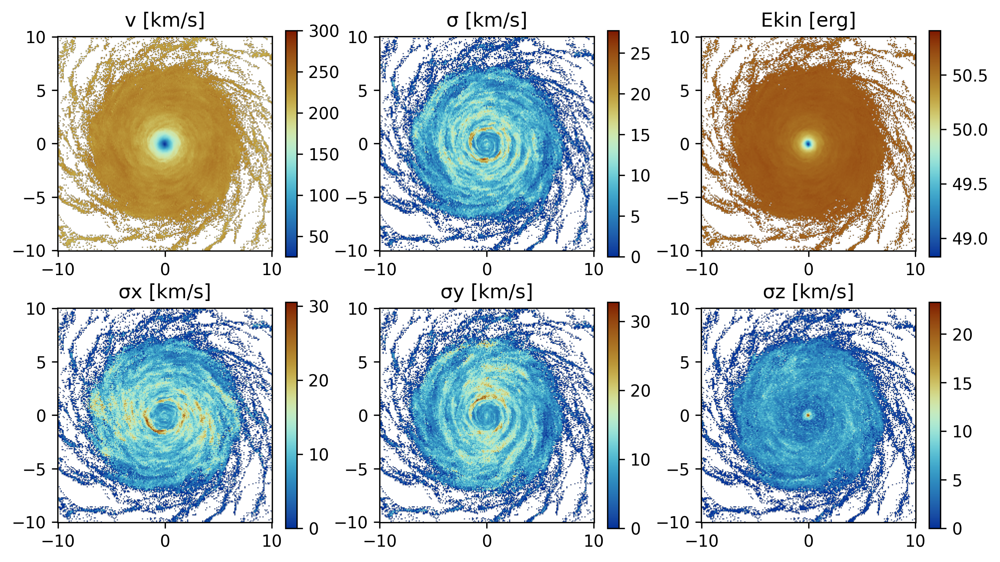

In [32]:
figure(figsize=(10, 5.5))

subplot(2, 3, 1)
title("v [km/s]")
imshow( (permutedims(proj_z.maps[:v])  ), cmap=cmap2, origin="lower", extent=getextent(proj_z, :kpc; center=true), vmax=300.)
colorbar()


subplot(2, 3, 2)
title("σ [km/s]")
imshow( (permutedims(proj_z.maps[:σ])  ), cmap=cmap2, origin="lower", extent=getextent(proj_z, :kpc; center=true))
colorbar()


subplot(2, 3, 3)
title("Ekin [erg]")
imshow( log10.(permutedims(proj_z.maps[:ekin]) ), cmap=cmap2, origin="lower", extent=getextent(proj_z, :kpc; center=true))
colorbar()


subplot(2, 3, 4)
title("σx [km/s]")
imshow( (permutedims(proj_z.maps[:σx])   ), cmap=cmap2, origin="lower", extent=getextent(proj_z, :kpc; center=true))
colorbar()


subplot(2, 3, 5)
title("σy [km/s]")
imshow( (permutedims(proj_z.maps[:σy])  ), cmap=cmap2, origin="lower", extent=getextent(proj_z, :kpc; center=true))
colorbar()


subplot(2, 3, 6)
title("σz [km/s]")
imshow( (permutedims(proj_z.maps[:σz])  ), cmap=cmap2, origin="lower", extent=getextent(proj_z, :kpc; center=true))
colorbar();


#### Use quantities in cylindrical coordinates:
#### Face-on disc (z-direction)
For the cylindrical or spherical components of a quantity, the center of the coordinate system is used (keywords: data_center = center default) and can be given with the keyword "data_center" and its units with "data_center_unit". Additionally, the quantities that are based on cartesian coordinates can be given.

In [33]:
# σr_cylinder: Radial velocity dispersion in cylindrical coordinates
# σϕ_cylinder: Azimuthal velocity dispersion (tangential motions)
proj_z = projection(particles, [:v, :σ, :σx, :σy, :ϕ, :r_cylinder, :vr_cylinder, :vϕ_cylinder, :σr_cylinder, :σϕ_cylinder],                    
                    units=[:km_s,:km_s,:km_s, :km_s, :standard, :kpc, :km_s, :km_s, :km_s, :km_s], 
                    xrange=[-10.,10.], yrange=[-10.,10.], zrange=[-2.,2.], 
                    center=[:boxcenter], range_unit=:kpc,
                    data_center=[24.,24.,24.], data_center_unit=:kpc); 

[Mera]: 2026-08-03T11:04:27.293

center: [0.5, 0.5, 0.5] ==> [24.0 [kpc] :: 24.0 [kpc] :: 24.0 [kpc]]

domain:
xmin::xmax: 0.2916667 :: 0.7083333  	==> 14.0 [kpc] :: 34.0 [kpc]
ymin::ymax: 0.2916667 :: 0.7083333  	==> 14.0 [kpc] :: 34.0 [kpc]
zmin::zmax: 0.4583333 :: 0.5416667  	==> 22.0 [kpc] :: 26.0 [kpc]

Effective resolution: 1024^2
Pixel size: 46.875 [pc]
Simulation min.: 46.875 [pc]



In [34]:
proj_z.maps

DataStructures.SortedDict{Any, Any, Base.Order.ForwardOrdering} with 18 entries:
  :r_cylinder   => [14.0758 14.0427 … 14.1201 14.1534; 14.0427 14.0096 … 14.087…
  :sd           => [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0…
  :v            => [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN…
  :v2           => [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN…
  :vr_cylinder  => [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN…
  :vr_cylinder2 => [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN…
  :vx           => [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN…
  :vx2          => [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN…
  :vy           => [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN…
  :vy2          => [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN…
  :vϕ_cylinder  => [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN…
  :vϕ_cylinder2 => [NaN NaN 

In [35]:
proj_z.maps_unit

DataStructures.SortedDict{Any, Any, Base.Order.ForwardOrdering} with 18 entries:
  :r_cylinder   => :kpc
  :sd           => :standard
  :v            => :km_s
  :v2           => :standard
  :vr_cylinder  => :km_s
  :vr_cylinder2 => :standard
  :vx           => :standard
  :vx2          => :standard
  :vy           => :standard
  :vy2          => :standard
  :vϕ_cylinder  => :km_s
  :vϕ_cylinder2 => :standard
  :σ            => :km_s
  :σr_cylinder  => :km_s
  :σx           => :km_s
  :σy           => :km_s
  :σϕ_cylinder  => :km_s
  :ϕ            => :radian

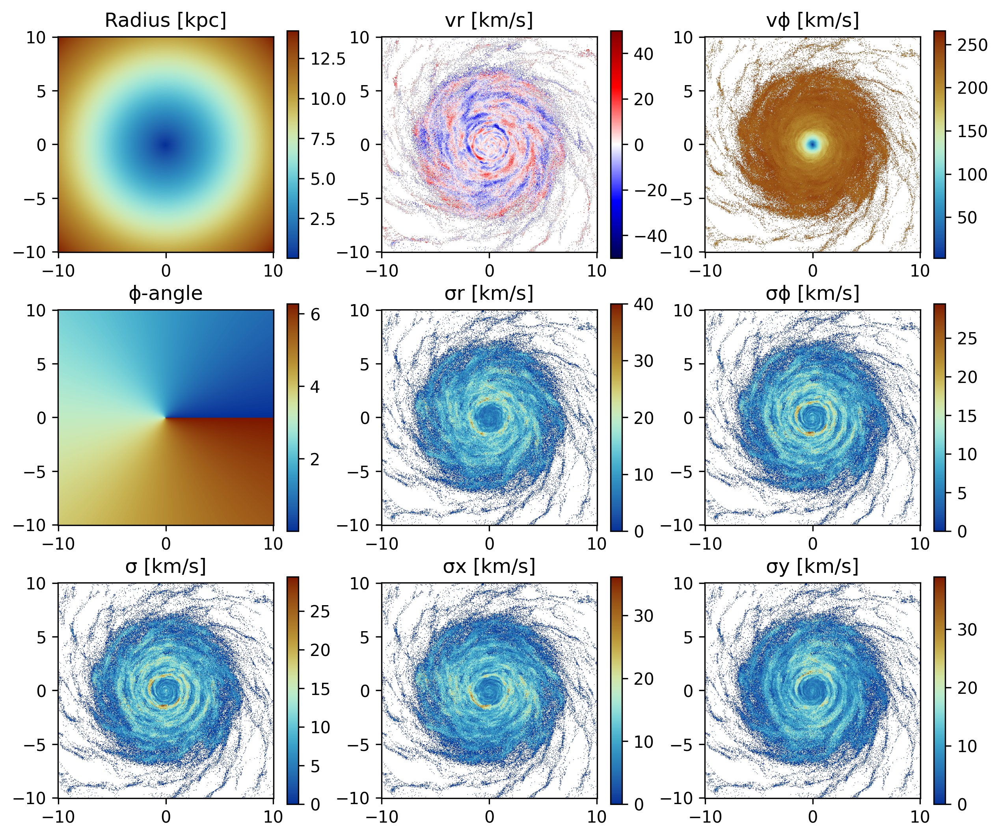

In [36]:
figure(figsize=(10, 8.5))

subplot(3, 3, 1)
title("Radius [kpc]")
imshow( permutedims(proj_z.maps[:r_cylinder]  ), cmap=cmap2, origin="lower", extent=getextent(proj_z, :kpc; center=true))
colorbar()


subplot(3, 3, 2)
title("vr [km/s]")
imshow( permutedims(proj_z.maps[:vr_cylinder] ), cmap="seismic", origin="lower", extent=getextent(proj_z, :kpc; center=true), vmin=-50.,vmax=50.)
colorbar()


subplot(3, 3, 3)
title("vϕ [km/s]")
imshow( permutedims(proj_z.maps[:vϕ_cylinder]  ), cmap=cmap2, origin="lower", extent=getextent(proj_z, :kpc; center=true))
colorbar()



subplot(3, 3, 4)
title("ϕ-angle")
imshow( (permutedims(proj_z.maps[:ϕ]) ), cmap=cmap2, origin="lower", extent=getextent(proj_z, :kpc; center=true))
colorbar()



subplot(3, 3, 5)
title("σr [km/s]")
imshow( permutedims(proj_z.maps[:σr_cylinder]  ), cmap=cmap2, origin="lower", extent=getextent(proj_z, :kpc; center=true))
colorbar()


subplot(3, 3, 6)
title("σϕ [km/s]")
imshow( permutedims(proj_z.maps[:σϕ_cylinder] ), cmap=cmap2, origin="lower", extent=getextent(proj_z, :kpc; center=true))
colorbar()



subplot(3, 3, 7)
title("σ [km/s]")
imshow( (permutedims(proj_z.maps[:σ]) ), cmap=cmap2, origin="lower", extent=getextent(proj_z, :kpc; center=true))
colorbar()



subplot(3, 3, 8)
title("σx [km/s]")
imshow( permutedims(proj_z.maps[:σx]  ), cmap=cmap2, origin="lower", extent=getextent(proj_z, :kpc; center=true))
colorbar()


subplot(3, 3, 9)
title("σy [km/s]")
imshow( permutedims(proj_z.maps[:σy] ), cmap=cmap2, origin="lower", extent=getextent(proj_z, :kpc; center=true))
colorbar();

## Project on a Coarser Grid

### lmax
The default is the projection on the maximum loaded grid level (always provided in the output). Choose a smaller/larger level with the keyword `lmax` (independend on the maximum level of the simulation) to project on a coarser/finer grid. By default, the data is assumed to be in the center of the simulation box.

In [37]:
# lmax=6: Uses AMR level 6 → 2^6 = 64x64 effective grid cells
proj_z = projection(particles, 
                    [:v, :σ, :σx, :σy, :σz, :vr_cylinder, :vϕ_cylinder, :σr_cylinder, :σϕ_cylinder], 
                    :km_s, 
                    xrange=[-10.,10.], yrange=[-10.,10.], zrange=[-2.,2.],
                    center=[:boxcenter], range_unit=:kpc,
                    lmax=6); 

[Mera]: 2026-08-03T11:04:31.367



center: [0.5, 0.5, 0.5] ==> [24.0 [kpc] :: 24.0 [kpc] :: 24.0 [kpc]]

domain:
xmin::xmax: 0.2916667 :: 0.7083333  	==> 14.0 [kpc] :: 34.0 [kpc]
ymin::ymax: 0.2916667 :: 0.7083333  	==> 14.0 [kpc] :: 34.0 [kpc]
zmin::zmax: 0.4583333 :: 0.5416667  	==> 22.0 [kpc] :: 26.0 [kpc]

Effective resolution: 64^2
Pixel size: 750.0 [pc]
Simulation min.: 46.875 [pc]



The projection onto the maximum loaded grid is always provided:

In [38]:
proj_z.maps

DataStructures.SortedDict{Any, Any, Base.Order.ForwardOrdering} with 19 entries:
  :sd           => [3.6988e-5 6.11725e-5 … 2.84523e-5 4.26785e-6; 0.000146885 8…
  :v            => [215.727 217.893 … 213.689 211.398; 211.909 214.371 … 215.29…
  :v2           => [10.8327 11.0472 … 10.6218 10.3945; 10.4511 10.6909 … 10.782…
  :vr_cylinder  => [-4.97035 9.83744 … 0.326624 -5.23378; -8.36334 3.71396 … 7.…
  :vr_cylinder2 => [0.0231364 0.0346302 … 0.0196151 0.0344127; 0.0339309 0.0312…
  :vx           => [2.38824 2.13472 … -2.30736 -2.28246; 2.4166 2.28742 … -2.49…
  :vx2          => [5.71099 4.56492 … 5.33794 5.23511; 5.844 5.24859 … 6.2532 6…
  :vy           => [-2.25778 -2.54366 … -2.29652 -2.26901; -2.14059 -2.32778 … …
  :vy2          => [5.12035 6.48209 … 5.28291 5.15929; 4.60593 5.44099 … 4.5285…
  :vz           => [-0.032174 0.00624848 … -0.0229633 0.00636579; -0.0269481 -0…
  :vz2          => [0.00140393 0.000219812 … 0.000962049 0.000127987; 0.0011519…
  :vϕ_cylinder  => [215.479 

In [39]:
proj_z.maps_unit

DataStructures.SortedDict{Any, Any, Base.Order.ForwardOrdering} with 19 entries:
  :sd           => :standard
  :v            => :km_s
  :v2           => :standard
  :vr_cylinder  => :km_s
  :vr_cylinder2 => :standard
  :vx           => :standard
  :vx2          => :standard
  :vy           => :standard
  :vy2          => :standard
  :vz           => :standard
  :vz2          => :standard
  :vϕ_cylinder  => :km_s
  :vϕ_cylinder2 => :standard
  :σ            => :km_s
  :σr_cylinder  => :km_s
  :σx           => :km_s
  :σy           => :km_s
  :σz           => :km_s
  :σϕ_cylinder  => :km_s

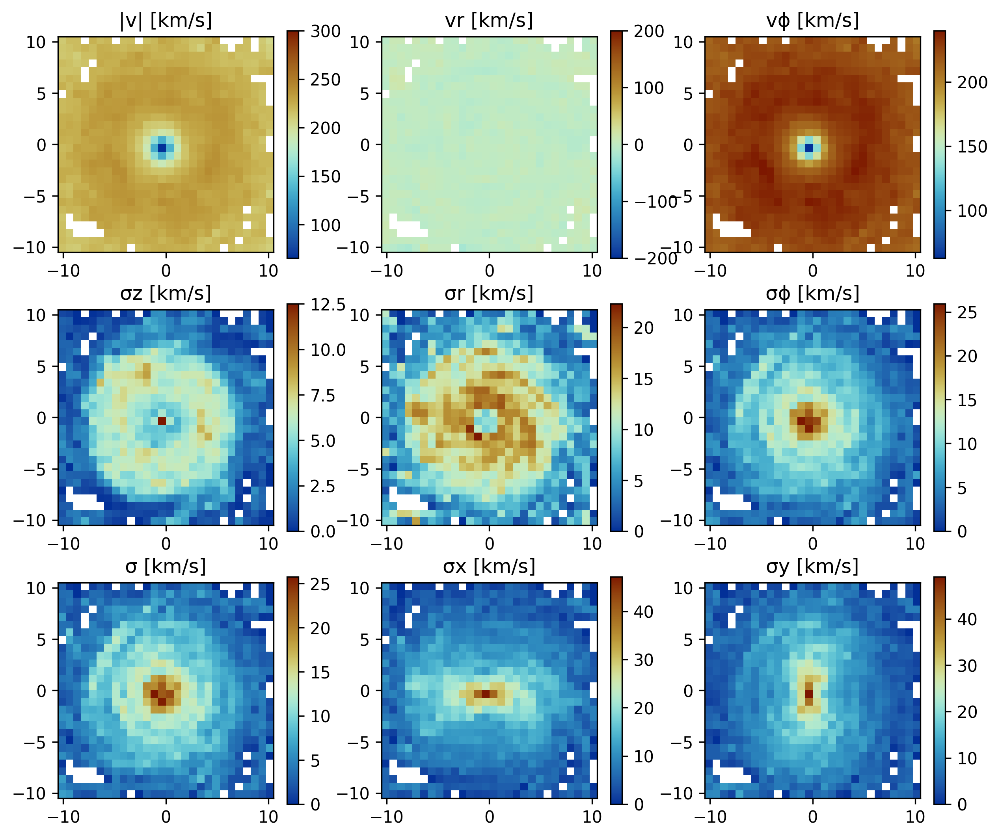

In [40]:
figure(figsize=(10, 8.5))

subplot(3, 3, 1)
title("|v| [km/s]")
imshow( permutedims(proj_z.maps[:v]  ), cmap=cmap2, origin="lower", extent=getextent(proj_z, :kpc; center=true), vmax=300.)
colorbar()


subplot(3, 3, 2)
title("vr [km/s]")
imshow( permutedims(proj_z.maps[:vr_cylinder] ), cmap=cmap2, origin="lower", extent=getextent(proj_z, :kpc; center=true), vmin=-200.,vmax=200.)
colorbar()


subplot(3, 3, 3)
title("vϕ [km/s]")
imshow( permutedims(proj_z.maps[:vϕ_cylinder]  ), cmap=cmap2, origin="lower", extent=getextent(proj_z, :kpc; center=true))
colorbar()



subplot(3, 3, 4)
title("σz [km/s]")
imshow( (permutedims(proj_z.maps[:σz]) ), cmap=cmap2, origin="lower", extent=getextent(proj_z, :kpc; center=true))
colorbar()



subplot(3, 3, 5)
title("σr [km/s]")
imshow( (permutedims(proj_z.maps[:σr_cylinder]  )), cmap=cmap2, origin="lower", extent=getextent(proj_z, :kpc; center=true))
colorbar()


subplot(3, 3, 6)
title("σϕ [km/s]")
imshow( (permutedims(proj_z.maps[:σϕ_cylinder] )), cmap=cmap2, origin="lower", extent=getextent(proj_z, :kpc; center=true))
colorbar()



subplot(3, 3, 7)
title("σ [km/s]")
imshow( (permutedims(proj_z.maps[:σ]) ), cmap=cmap2, origin="lower", extent=getextent(proj_z, :kpc; center=true))
colorbar()



subplot(3, 3, 8)
title("σx [km/s]")
imshow( (permutedims(proj_z.maps[:σx]  )), cmap=cmap2, origin="lower", extent=getextent(proj_z, :kpc; center=true))
colorbar()


subplot(3, 3, 9)
title("σy [km/s]")
imshow( (permutedims(proj_z.maps[:σy] )), cmap=cmap2, origin="lower", extent=getextent(proj_z, :kpc; center=true))
colorbar();

### res
Choose the effective resolution (related to the full box) of the projected grid:

In [41]:
# pxsize=[0.5, :kpc]: 0.5 kpc pixels (~96x96 over the 48 kpc box) 
proj_z = projection(particles, 
                    [:v, :σ, :σx, :σy, :σz, :vr_cylinder, :vϕ_cylinder, :σr_cylinder, :σϕ_cylinder], 
                    :km_s, 
                    xrange=[-10.,10.], yrange=[-10.,10.], zrange=[-2.,2.],
                    center=[:boxcenter], range_unit=:kpc,
                    pxsize=[0.5, :kpc]); 

[Mera]: 2026-08-03T11:04:34.616



center: [0.5, 0.5, 0.5] ==> [24.0 [kpc] :: 24.0 [kpc] :: 24.0 [kpc]]

domain:
xmin::xmax: 0.2916667 :: 0.7083333  	==> 14.0 [kpc] :: 34.0 [kpc]
ymin::ymax: 0.2916667 :: 0.7083333  	==> 14.0 [kpc] :: 34.0 [kpc]
zmin::zmax: 0.4583333 :: 0.5416667  	==> 22.0 [kpc] :: 26.0 [kpc]

Effective resolution: 97^2
Pixel size: 494.845 [pc]
Simulation min.: 46.875 [pc]



### pxsize
Choose the pixel size in a physical unit, e.g. pixel-size=100 pc. The data is projected to a grid with a pixel-size that is closest to the given number, but not larger:

In [42]:
# pxsize=[100.,:pc]: Each pixel represents ~100 pc physical size
proj_z = projection(particles, 
                    [:v, :σ, :σx, :σy, :σz, :vr_cylinder, :vϕ_cylinder, :σr_cylinder, :σϕ_cylinder], 
                    :km_s, 
                    xrange=[-10.,10.], yrange=[-10.,10.], zrange=[-2.,2.],
                    center=[:boxcenter], range_unit=:kpc,
                    pxsize=[100., :pc]); 

[Mera]: 2026-08-03T11:04:36.736

center: [0.5, 0.5, 0.5] ==> [24.0 [kpc] :: 24.0 [kpc] :: 24.0 [kpc]]

domain:
xmin::xmax: 0.2916667 :: 0.7083333  	==> 14.0 [kpc] :: 34.0 [kpc]
ymin::ymax: 0.2916667 :: 0.7083333  	==> 14.0 [kpc] :: 34.0 [kpc]
zmin::zmax: 0.4583333 :: 0.5416667  	==> 22.0 [kpc] :: 26.0 [kpc]

Effective resolution: 481^2
Pixel size: 99.792 [pc]
Simulation min.: 46.875 [pc]



## Projection of the Birth/Age-Time

Project the average birth-time of the particles to the grid:

In [43]:
# :birth - Absolute formation time in simulation units (when star formed)
proj_z = projection(particles, :birth, :Myr,
                    lmax=8,  zrange=[0.45,0.55], center=[0.,0.,0.], verbose=false); 
proj_x = projection(particles, :birth, :Myr,
                    lmax=8,  zrange=[0.45,0.55], center=[0.,0.,0.], direction=:x, verbose=false); 

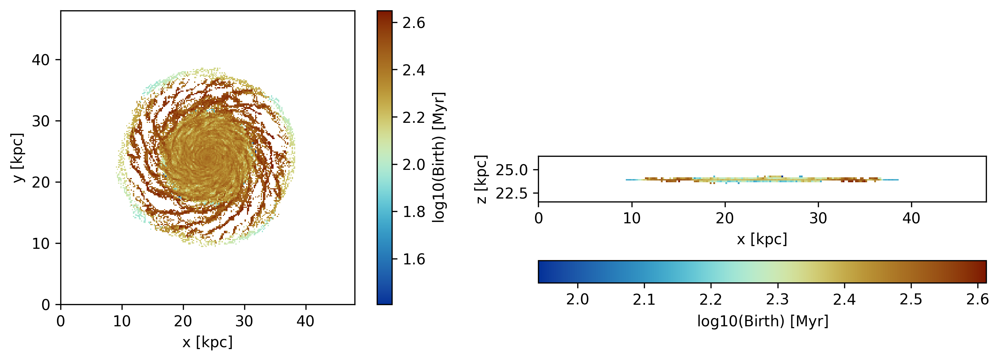

In [44]:
figure(figsize=(10, 3.5))
subplot(1,2,1)
im = imshow( log10.( permutedims(proj_z.maps[:birth])), cmap=cmap2, aspect=proj_z.ratio, origin="lower", extent=getextent(proj_z, :kpc; center=true))
xlabel("x [kpc]")
ylabel("y [kpc]")
cb = colorbar(im, label=L"\mathrm{log10(Birth) \ [Myr]}")

subplot(1,2,2)
im = imshow( log10.( permutedims(proj_x.maps[:birth])), cmap=cmap2, origin="lower", extent=getextent(proj_x, :kpc; center=true))
xlabel("x [kpc]")
ylabel("z [kpc]")
cb = colorbar(im, label=L"\mathrm{log10(Birth) \ [Myr]}",orientation="horizontal", pad=0.2);
tight_layout()

Project the average age of the particles to the grid. The age is taken relative to the loaded snapshot time by default.

In [45]:
# :age - Relative age = snapshot_time - birth_time (how old star is now)
proj_z = projection(particles, :age, :Myr,
                    lmax=8,  zrange=[0.45,0.55], center=[0.,0.,0.], verbose=false); 
proj_x = projection(particles, :age, :Myr,
                    lmax=8,  zrange=[0.45,0.55], direction=:x,  center=[0.,0.,0.], verbose=false); 

The reference time (code units) for the age calculation:

In [46]:
proj_z.ref_time

29.9031937665063

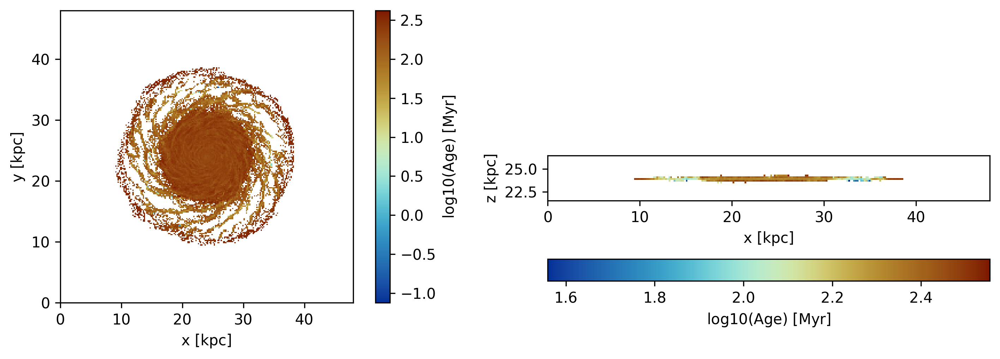

In [47]:
figure(figsize=(10, 3.5))
subplot(1,2,1)
im = imshow( log10.( permutedims(proj_z.maps[:age])), cmap=cmap2, aspect=proj_z.ratio, origin="lower", extent=getextent(proj_z, :kpc; center=true))
xlabel("x [kpc]")
ylabel("y [kpc]")
cb = colorbar(im, label=L"\mathrm{log10(Age) \ [Myr]}")

subplot(1,2,2)
im = imshow( log10.( permutedims(proj_x.maps[:age])), cmap=cmap2, origin="lower", extent=getextent(proj_x, :kpc; center=true))
xlabel("x [kpc]")
ylabel("z [kpc]")
cb = colorbar(im, label=L"\mathrm{log10(Age) \ [Myr]}",orientation="horizontal", pad=0.2);
tight_layout()

Project the average age of the particles relative to a given reference time:

In [48]:
proj_z = projection(particles, :age, :Myr, ref_time=0.,
                    lmax=8,  zrange=[0.45,0.55], center=[0.,0.,0.], verbose=false); 
proj_x = projection(particles, :age, :Myr, ref_time = 0.,
                    lmax=8,  zrange=[0.45,0.55], center=[0.,0.,0.], direction=:x, verbose=false); 

The reference time (code units) for the age calculation:

In [49]:
proj_z.ref_time

0.0

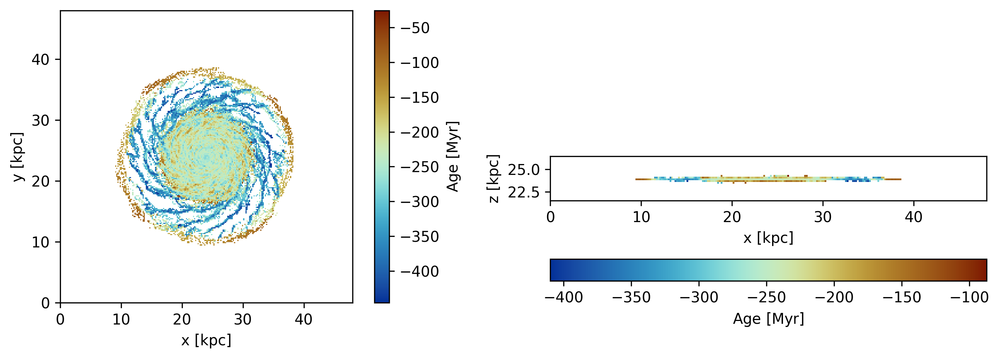

In [50]:
figure(figsize=(10, 3.5))
subplot(1,2,1)
im = imshow( ( permutedims(proj_z.maps[:age])), cmap=cmap2, aspect=proj_z.ratio, origin="lower", extent=getextent(proj_z, :kpc; center=true))
xlabel("x [kpc]")
ylabel("y [kpc]")
cb = colorbar(im, label=L"\mathrm{Age \ [Myr]}")

subplot(1,2,2)
im = imshow( ( permutedims(proj_x.maps[:age])), cmap=cmap2, origin="lower", extent=getextent(proj_x, :kpc; center=true))
xlabel("x [kpc]")
ylabel("z [kpc]")
cb = colorbar(im, label=L"\mathrm{Age \ [Myr]}",orientation="horizontal", pad=0.2);
tight_layout()

## Projection of Masked Data

Mask particles with ages higher than 400 Myr by creating a Bool-array where the smaller ages correspond to false entries:

In [51]:
mask = getvar(particles, :age, :Myr) .> 400. ;

In [52]:
proj_z = projection(particles, :age, :Myr, mask=mask,
                    lmax=8,  zrange=[0.45,0.55], center=[0.,0.,0.]); 
proj_x = projection(particles, :age, :Myr, mask=mask,
                    lmax=8,  zrange=[0.45,0.55], center=[0.,0.,0.], direction=:x); 

[Mera]: 2026-08-03T11:04:51.127



domain:
xmin::xmax: 0.0 :: 1.0  	==> 0.0 [kpc] :: 48.0 [kpc]
ymin::ymax: 0.0 :: 1.0  	==> 0.0 [kpc] :: 48.0 [kpc]
zmin::zmax: 0.45 :: 0.55  	==> 21.6 [kpc] :: 26.4 [kpc]

Effective resolution: 256^2
Pixel size: 187.5 [pc]
Simulation min.: 46.875 [pc]

:mask provided by function



[Mera]: 2026-08-03T11:04:54.399



domain:
xmin::xmax: 0.0 :: 1.0  	==> 0.0 [kpc] :: 48.0 [kpc]
ymin::ymax: 0.0 :: 1.0  	==> 0.0 [kpc] :: 48.0 [kpc]
zmin::zmax: 0.45 :: 0.55  	==> 21.6 [kpc] :: 26.4 [kpc]

Effective resolution: 256^2
Pixel size: 187.5 [pc]
Simulation min.: 46.875 [pc]

:mask provided by function



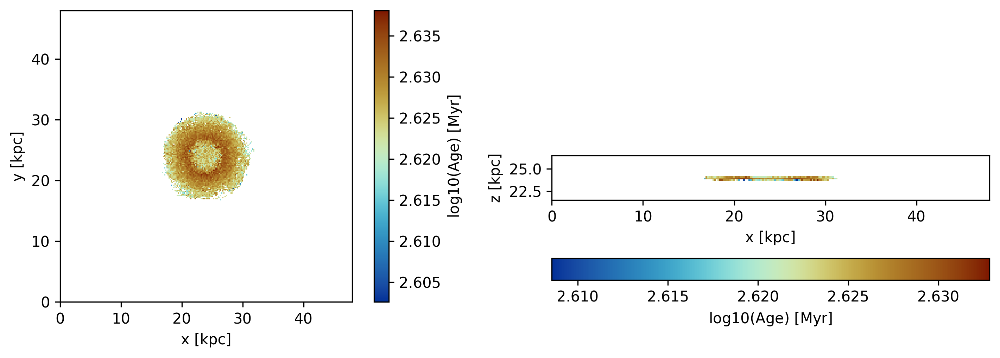

In [53]:
figure(figsize=(10, 3.5))
subplot(1,2,1)
im = imshow( log10.( permutedims(proj_z.maps[:age])), cmap=cmap2, aspect=proj_z.ratio, origin="lower", extent=getextent(proj_z, :kpc; center=true))
xlabel("x [kpc]")
ylabel("y [kpc]")
cb = colorbar(im, label=L"\mathrm{log10(Age) \ [Myr]}")

subplot(1,2,2)
im = imshow( log10.( permutedims(proj_x.maps[:age])), cmap=cmap2, origin="lower", extent=getextent(proj_x, :kpc; center=true))
xlabel("x [kpc]")
ylabel("z [kpc]")
cb = colorbar(im, label=L"\mathrm{log10(Age) \ [Myr]}",orientation="horizontal", pad=0.2);
tight_layout()

## Summary

### Key Accomplishments
In this tutorial, you have learned to:
- Create basic particle projections with mass weighting
- Configure custom resolution and spatial extent
- Generate projections along different axes
- Perform age-based stellar population analysis
- Access and analyze projection data arrays


### Particle Projection Capabilities
- **Stellar Properties**: Mass, age, metallicity, birth time projections
- **Kinematic Analysis**: Velocity component projections  
- **Population Studies**: Age gradients and stellar distribution analysis
- **Multi-component**: Separate star and dark matter projections
- **Custom Weighting**: Mass-weighted or number-weighted projections